<a href="https://colab.research.google.com/github/sjkim-audio/Bass-separator/blob/main/notebooks/transcription/03_tab_generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import librosa
import librosa.display
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal
from IPython.display import Audio, display
from google.colab import drive

In [ ]:
import sys

# [설정] 프로젝트 및 데이터 경로
REPO_URL = "https://github.com/sjkim-audio/Bass-separator.git"
PROJECT_NAME = "Bass-separator"

# 1. Git 프로젝트 설정 (Clone & Path)
# 1-1. 깃허브에서 프로젝트 다운로드
if not os.path.exists(PROJECT_NAME):
    print(f"Cloning repository... ({PROJECT_NAME})")
    !git clone {REPO_URL}
else:
    print("Repository already exists.")

# 1-2. 작업 경로 변경 (Repo 폴더 안으로 이동)
if PROJECT_NAME not in os.getcwd():
    os.chdir(PROJECT_NAME)
    print(f"Changed working directory: {os.getcwd()}")

# 1-3. 시스템 경로 추가 (src 폴더 인식을 위함)
if os.getcwd() not in sys.path:
    sys.path.append(os.getcwd())

# 구글 드라이브 내 데이터셋 원본 위치
MY_DRIVE_PATH = "/content/drive/MyDrive/Bass_separator/dataset"
# src 의 데이터셋 로드 함수 실행
from src.utils import load_data_from_drive
load_data_from_drive(MY_DRIVE_PATH)


Cloning repository... (Bass-separator)
Cloning into 'Bass-separator'...
remote: Enumerating objects: 344, done.
remote: Counting objects: 100% (206/206), done.
remote: Compressing objects: 100% (165/165), done.
remote: Total 344 (delta 117), reused 33 (delta 33), pack-reused 138 (from 1)
Receiving objects: 100% (344/344), 155.96 MiB | 20.24 MiB/s, done.
Resolving deltas: 100% (169/169), done.
Mounted at /content/drive
🚀 데이터 복사 시작: /content/drive/MyDrive/Bass_separator/dataset -> ./dataset
데이터 준비 완료! 로컬 경로('./dataset')를 사용하세요.


### 📦 환경 설정: FFmpeg, torchaudio, torchcodec 설치

Demucs가 정상적으로 동작하도록 필요한 라이브러리들을 설치 및 재설치합니다. 특히 `torchcodec`의 `RuntimeError` 문제를 해결하기 위해 FFmpeg을 시스템에 설치하고, `torchaudio` 및 `torchcodec`를 재설치하여 호환성을 확보합니다.

In [ ]:
import subprocess

print("📦 FFmpeg 라이브러리 업데이트 및 재설치 중...")
# apt-get update 먼저 실행
update_process = subprocess.run(['apt-get', 'update', '-qq'], capture_output=True, text=True, check=False)
if update_process.returncode != 0:
    print("apt-get update failed:", update_process.stderr)

# ffmpeg 설치
ffmpeg_install_process = subprocess.run(['apt-get', 'install', '-y', 'ffmpeg'], capture_output=True, text=True, check=False)
if ffmpeg_install_process.returncode != 0:
    print("ffmpeg install failed:", ffmpeg_install_process.stderr)
else:
    print("✅ FFmpeg 설치 완료.")

print("📦 torchaudio 및 torchcodec 재설치 중 (호환성 확보)...")
# 기존 torchcodec, torchaudio 제거
subprocess.run(['pip', 'uninstall', '-y', 'torchcodec', 'torchaudio'], capture_output=True, text=True, check=False)
# torchaudio 및 soundfile 재설치 (torchcodec의 호환 버전을 포함할 수 있음)
subprocess.run(['pip', 'install', 'torchaudio', 'soundfile'], capture_output=True, text=True, check=False)
# torchcodec 재설치
subprocess.run(['pip', 'install', 'torchcodec'], capture_output=True, text=True, check=False)


📦 FFmpeg 라이브러리 업데이트 및 재설치 중...
✅ FFmpeg 설치 완료.
📦 torchaudio 및 torchcodec 재설치 중 (호환성 확보)...


CompletedProcess(args=['pip', 'install', 'torchcodec'], returncode=0, stdout='Collecting torchcodec\n  Using cached torchcodec-0.10.0-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (11 kB)\nUsing cached torchcodec-0.10.0-cp312-cp312-manylinux_2_28_x86_64.whl (2.1 MB)\nInstalling collected packages: torchcodec\nSuccessfully installed torchcodec-0.10.0\n', stderr='')

In [ ]:
from IPython.display import Audio, display # Ensure these are available if re-running part of the notebook context

# [사용자 수정 영역] 분석할 오디오 파일의 경로를 입력
target_file_path = "/content/drive/MyDrive/Bass_separator/dataset/기타 베이스 분리 예제 2.wav"

# Demucs로 베이스 트랙 분리
print("🚀 Demucs 분리 시작...")

# 파일명 추출 (확장자 제외)
filename = os.path.splitext(os.path.basename(target_file_path))[0]

# Demucs 실행 (htdemucs 모델 사용)
# -n htdemucs: 고성능 모델
cmd = f'demucs -n htdemucs "{target_file_path}"'
process = subprocess.run(cmd, shell=True, capture_output=True, text=True, check=False)

# 분리된 베이스 파일 경로 자동 탐색
# Demucs 기본 출력 경로: separated/htdemucs/파일명/bass.wav
bass_stem_path = os.path.join('separated', 'htdemucs', filename, 'bass.wav')

if not os.path.exists(bass_stem_path):
    print("Demucs Command Output:")
    print(process.stdout)
    print("Demucs Command Error:")
    print(process.stderr)
    raise FileNotFoundError(f"❌ 분리 실패! 경로에 파일이 없습니다: {bass_stem_path}. Demucs 실행 로그를 확인하세요.")

print(f"✅ 분리 완료! 베이스 트랙 경로: {bass_stem_path}")

# 오디오 재생
print("🎧 분리된 베이스 트랙 듣기:")
display(Audio(bass_stem_path))

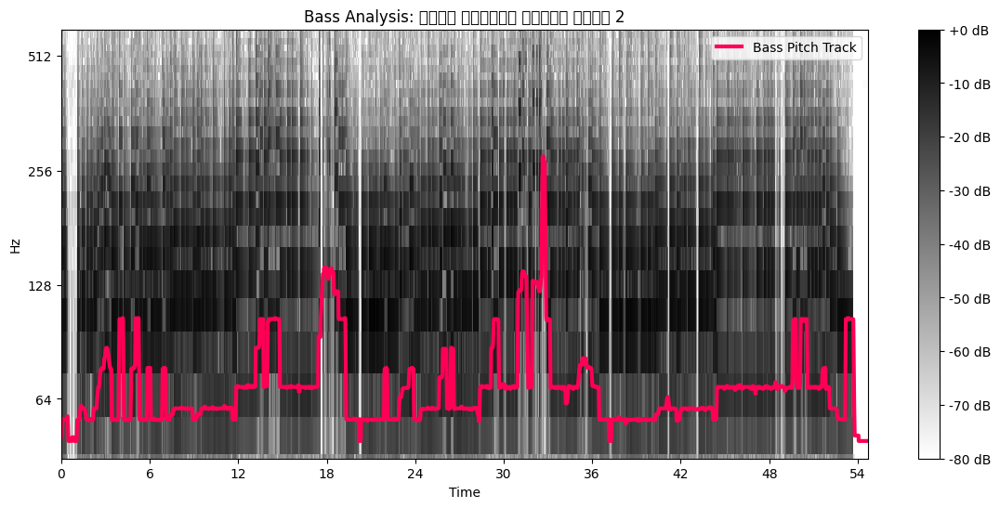

🎧 분리된 베이스 트랙 듣기:


In [ ]:
# 4. 베이스 트랙 로드 및 피치 트래킹

# 오디오 로드
y, sr = librosa.load(bass_stem_path, sr=44100)

# [핵심] 베이스 기타에 최적화된 파라미터 튜닝
# 베이스 음역: E1(41Hz) ~ G4(392Hz) 근처
f0, voiced_flag, voiced_probs = librosa.pyin(
    y,
    fmin=40,
    fmax=400,
    sr=sr,
    hop_length=512,
    frame_length=4096, # 👈 저음 해상도를 위해 윈도우 크기를 2배로 늘림
    fill_na=None
)

# [후처리] 미디언 필터로 튀는 값(Outlier) 보정
if np.any(np.isfinite(f0)):
    f0_clean = scipy.signal.medfilt(f0, kernel_size=5)
else:
    f0_clean = f0

# 5. 결과 시각화 및 청취
plt.figure(figsize=(14, 6))

# 배경: 스펙트로그램
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log', sr=sr, cmap='gray_r')

# 전경: 추출한 피치 (빨간 선)
times = librosa.times_like(f0, sr=sr)
plt.plot(times, f0_clean, label='Bass Pitch Track', color='#ff0055', linewidth=3)

# 그래프 설정
plt.ylim(30, 600) # 베이스 음역대에 맞춰 줌인
plt.title(f'Bass Analysis: {filename}')
plt.legend(loc='upper right')
plt.colorbar(format='%+2.0f dB')
plt.show()

# 오디오 재생
print("🎧 분리된 베이스 트랙 듣기:")
display(Audio(bass_stem_path))

In [ ]:
import numpy as np
import librosa

class SimpleBassTab:
    def __init__(self):
        # 4현 베이스 표준 튜닝 (MIDI Note Number)
        # 4번줄(E1)=28, 3번줄(A1)=33, 2번줄(D2)=38, 1번줄(G2)=43
        self.tuning = [28, 33, 38, 43]
        self.string_names = ["E", "A", "D", "G"]

    def hz_to_fret(self, hz):
        """주파수(Hz)를 받아서 (줄번호, 프렛)을 반환"""
        if hz is None or hz == 0 or np.isnan(hz):
            return None # 무음

        # 1. Hz -> MIDI 노트 번호 변환 (반올림)
        midi_note = int(round(librosa.hz_to_midi(hz)))

        # 2. 가능한 모든 운지 위치(Position) 찾기
        candidates = []
        for string_idx, open_note in enumerate(self.tuning):
            fret = midi_note - open_note
            # 베이스는 보통 0~24프렛
            if 0 <= fret <= 24:
                candidates.append((string_idx, fret))

        if not candidates:
            return None # 표현 불가능한 음 (너무 낮거나 높음)

        # 3. [알고리즘] 가장 쉬운 운지 선택 (프렛 번호가 가장 낮은 것)
        # 예: 개방현(0프렛)이 가능하면 무조건 0프렛 선택
        best_pos = min(candidates, key=lambda x: x[1])

        return best_pos # (줄인덱스, 프렛번호) 반환

    def print_tab(self, f0_array, sr, hop_length, time_step=0.2):
        """
        f0 데이터를 읽어서 타브 악보를 출력
        time_step: 악보를 그리는 시간 간격 (초 단위, 기본 0.2초)
        """
        print(f"{'Time':<8} | {'Note':<5} | {'Tab (G-D-A-E)'}")
        print("-" * 40)

        # 데이터를 너무 많이 출력하면 보기 힘드니, 일정 간격으로 샘플링
        frames_per_step = int(time_step * sr / hop_length)

        prev_note = -1 # 중복 출력 방지용

        for i in range(0, len(f0_array), frames_per_step):
            pitch = f0_array[i]
            current_time = i * hop_length / sr

            # 피치가 없거나(NaN) 0인 경우 패스 (쉼표)
            if np.isnan(pitch) or pitch == 0:
                continue

            pos = self.hz_to_fret(pitch)
            if pos:
                string_idx, fret = pos
                note_name = librosa.midi_to_note(int(round(librosa.hz_to_midi(pitch))))

                # 시각화: 4줄 타브 (G D A E 순서)
                # 선택된 줄에만 숫자를 넣고 나머지는 '-'
                tab_visual = ["-"] * 4
                # string_idx: 0(E)~3(G). 타브는 위가 G(3) 아래가 E(0)
                tab_visual[3 - string_idx] = str(fret)

                tab_str = "|".join(tab_visual)

                print(f"{current_time:5.1f}s  | {note_name:<5} |  {tab_str}")

# ==========================================
# 실행 코드
# ==========================================
# 앞선 코드에서 구한 f0_clean 데이터 사용
generator = SimpleBassTab()

print("\n🎸 Generated Bass Tab (Sampling every 0.2s)")
print("G | D | A | E  (Standard Tuning)")
print("=" * 40)

# f0_clean: 앞선 피치 트래킹 결과 변수
# hop_length: 앞선 설정값 (512)
generator.print_tab(f0_clean, sr=44100, hop_length=512, time_step=0.25)

In [ ]:
import librosa
import numpy as np
import pandas as pd

class RhythmicTabGenerator:
    def __init__(self):
        # 4현 베이스 표준 튜닝 (MIDI Number: E1, A1, D2, G2)
        self.tuning = [28, 33, 38, 43]
        self.string_names = ["E", "A", "D", "G"]

    def hz_to_fret(self, hz):
        """주파수를 (줄번호, 프렛)으로 변환"""
        if hz is None or hz == 0 or np.isnan(hz):
            return None

        midi_note = int(round(librosa.hz_to_midi(hz)))
        candidates = []

        for string_idx, open_note in enumerate(self.tuning):
            fret = midi_note - open_note
            if 0 <= fret <= 24:
                candidates.append((string_idx, fret))

        if not candidates: return None

        # [Low Fret Priority] 가장 낮은 프렛 선택
        best_pos = min(candidates, key=lambda x: x[1])
        return best_pos

    def generate_tab(self, y, sr, f0_array, hop_length=512):
        """
        오디오(y)에서 온셋(치르는 순간)을 감지하고,
        해당 타이밍의 피치(f0)를 가져와 타브를 생성함
        """
        print(f"{'Time':<8} | {'Note':<5} | {'Tab (G-D-A-E)'}")
        print("=" * 45)

        # 1. 온셋 감지 (베이스 줄을 튕기는 순간 찾기)
        # backtrack=True: 온셋이 발생한 정확한 시점으로 미세 조정
        onset_frames = librosa.onset.onset_detect(
            y=y, sr=sr, hop_length=hop_length,
            backtrack=True, units='frames'
        )

        # 2. 각 온셋마다 악보 그리기
        for onset_frame in onset_frames:
            # [중요] 피치 안정화 (Pitch Stabilization)
            # 온셋 직후(Attack)에는 피치가 불안정하므로,
            # 온셋 시점부터 약 3~5프레임 뒤의 피치들의 '중간값(Median)'을 사용합니다.
            # 이렇게 해야 '틱' 하는 잡음 대신 진짜 '음정'을 잡습니다.

            check_window = 5 # 약 0.05초~0.1초 뒤까지 확인
            target_indices = range(onset_frame, min(onset_frame + check_window, len(f0_array)))

            # 해당 구간의 피치들을 가져옴 (NaN 제외)
            pitch_candidates = [f0_array[i] for i in target_indices if not np.isnan(f0_array[i])]

            if not pitch_candidates:
                continue # 유효한 피치가 없으면 패스 (타악기 소리 등)

            # 중간값 선택 (튀는 값 방지)
            stable_pitch = np.median(pitch_candidates)

            # 타브 변환
            pos = self.hz_to_fret(stable_pitch)

            if pos:
                # 시간 계산
                current_time = librosa.frames_to_time(onset_frame, sr=sr, hop_length=hop_length)

                # 노트 이름
                note_name = librosa.midi_to_note(int(round(librosa.hz_to_midi(stable_pitch))))

                # 타브 시각화
                string_idx, fret = pos
                tab_visual = ["-"] * 4
                tab_visual[3 - string_idx] = str(fret)
                tab_str = "|".join(tab_visual)

                print(f"{current_time:5.2f}s  | {note_name:<5} |  {tab_str}")

# ==========================================
# 실행
# ==========================================
# y, sr, f0_clean은 이전 단계(피치 트래킹)에서 생성된 변수여야 합니다.
# 만약 없다면 이전 코드를 먼저 실행해주세요.

tab_gen = RhythmicTabGenerator()
# hop_length는 pYIN 설정과 맞춰줍니다 (보통 512)
tab_gen.generate_tab(y, sr, f0_clean, hop_length=512)